In [5]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
import time
import random

In [6]:
environment = gym.make("Taxi-v3", render_mode="rgb_array")
environment.reset()

(46, {'prob': 1.0, 'action_mask': array([1, 0, 1, 0, 0, 0], dtype=int8)})

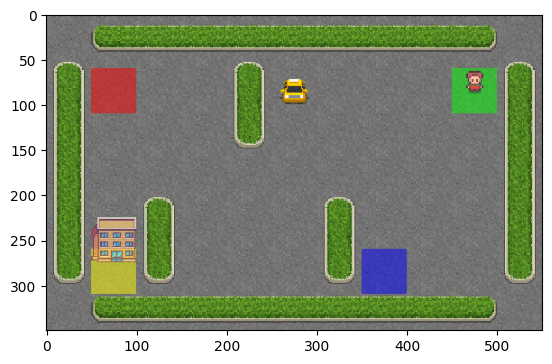

In [7]:
plt.imshow(environment.render())

## describe

1. State - Taxi's and passenger’s coordinates. There are 500 discrete states since there are 25 taxi positions, 5 possible locations of the passenger (including the case when the passenger is in the taxi), and 4 destination locations.

2. Reward - -1 per step unless other reward is triggered.

            +20 delivering passenger.

            -10 executing “pickup” and “drop-off” actions illegally.
            
3. Actions - 0: Move south (down)

            1: Move north (up)

            2: Move east (right)

            3: Move west (left)

            4: Pickup passenger

            5: Drop off passenger

## learning

### Value iteration

In [8]:
def one_step_lookahead(environment, state, V, discount_factor):
    action_values = np.zeros(environment.action_space.n)
    for action in range(environment.action_space.n):
        for probability, next_state, reward, terminated in environment.P[state][action]:
            action_values[action] += probability * (reward + discount_factor * V[next_state])
    return action_values


def value_iteration(environment, discount_factor=0.99, theta=1e-7, max_iterations=1e7):
    # Initialize state-value function with zeros for each environment state
    V = np.zeros(environment.observation_space.n)
    
    for i in range(int(max_iterations)):
        # Early stopping condition
        delta = 0
        
        # Update each state
        for state in range(environment.observation_space.n):
            # Do a one-step lookahead to calculate state-action values
            action_value = one_step_lookahead(environment, state, V, discount_factor)
            
            # Select best action to perform based on the highest state-action value
            best_action_value = np.max(action_value)
            
            # Calculate change in value
            delta = max(delta, np.abs(V[state] - best_action_value))
            
            # Update the value function for current state
            V[state] = best_action_value
            
        # Check if we can stop
        if delta < theta:
            break

    # Create a deterministic policy using the optimal value function
    policy = np.zeros([environment.observation_space.n, environment.action_space.n])
    for state in range(environment.observation_space.n):
        # One step lookahead to find the best action for this state
        action_value = one_step_lookahead(environment, state, V, discount_factor)
        
        # Select best action based on the highest state-action value
        best_action = np.argmax(action_value)
        
        # Update the policy to perform a better action at a current state
        policy[state, best_action] = 1.0
    return policy, V



In [13]:
def play_episodes(environment, n_episodes, discount_factor, theta, max_iterations, vis_episode=None):
    wins = 0
    total_reward = 0
    for episode in range(n_episodes):
        terminated = False
        state = environment.reset()[0]
        policy, _ = value_iteration(environment.env,
                                    discount_factor=discount_factor,
                                    theta=theta,
                                    max_iterations=max_iterations)
        while not terminated:
            if vis_episode is not None and episode == vis_episode:
                plt.imshow(environment.render())
                plt.show()
            # Select best action to perform in a current state
            action = np.argmax(policy[state])
            # Perform an action an observe how environment acted in response
            next_state, reward, terminated, truncated, info = environment.step(action)
            
            # Summarize total reward
            total_reward += reward

            # Update current state
            state = next_state
            
            # Calculate number of wins over episodes
            if terminated and reward == 20:
                wins += 1
                
    average_reward = total_reward / n_episodes
    return wins, total_reward, average_reward

In [15]:
def play_episodes_by_policy(environment, n_episodes, policy, vis_episode=None):
    wins = 0
    total_reward = 0
    for episode in range(n_episodes):
        terminated = False
        state = environment.reset()[0]
        while not terminated:
            if vis_episode is not None and episode == vis_episode:
                plt.imshow(environment.render())
                plt.show()
            # Select best action to perform in a current state
            action = np.argmax(policy[state])
            # Perform an action an observe how environment acted in response
            next_state, reward, terminated, truncated, info = environment.step(action)
            
            # Summarize total reward
            total_reward += reward

            # Update current state
            state = next_state
            
            # Calculate number of wins over episodes
            if terminated and reward == 20:
                wins += 1
                
    average_reward = total_reward / n_episodes
    return wins, total_reward, average_reward

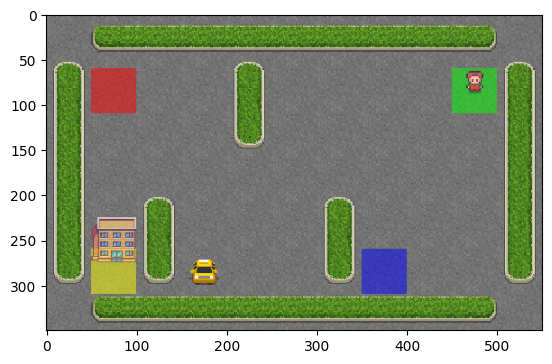

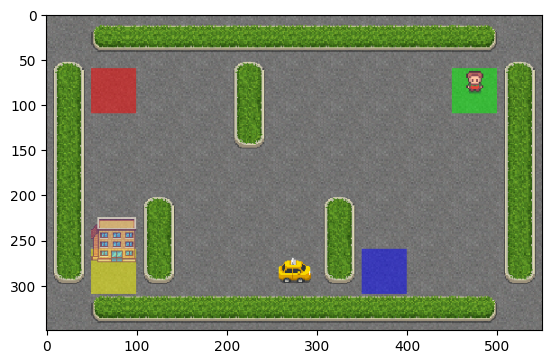

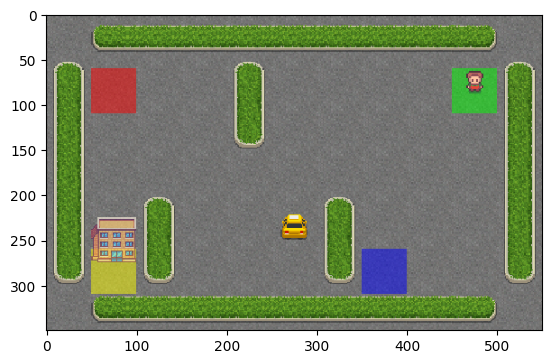

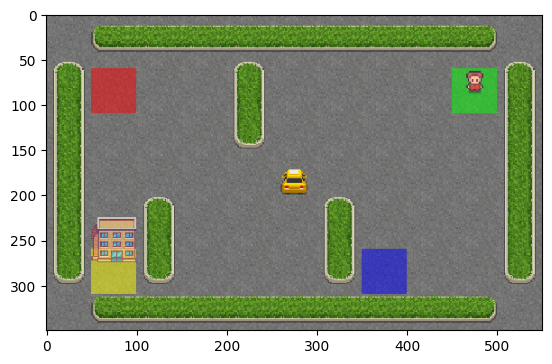

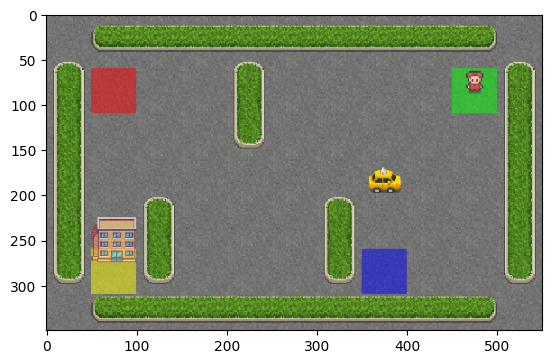

...

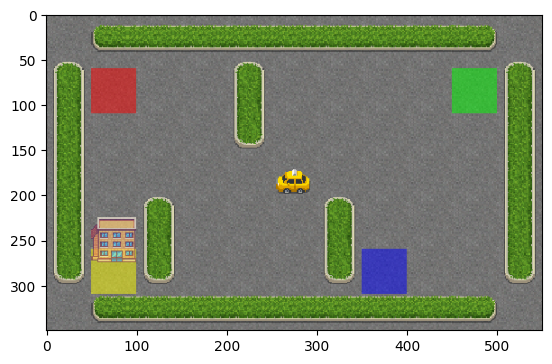

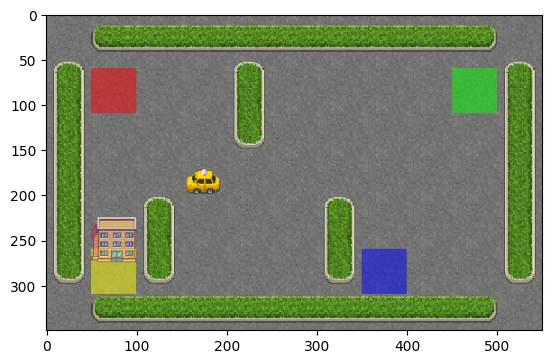

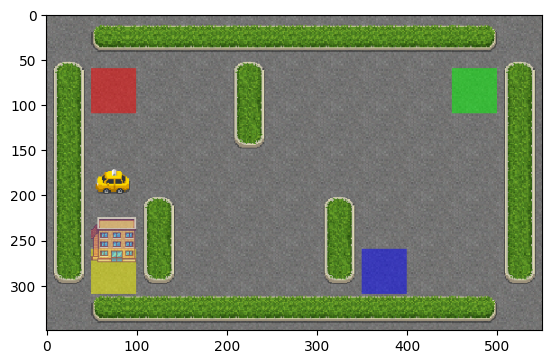

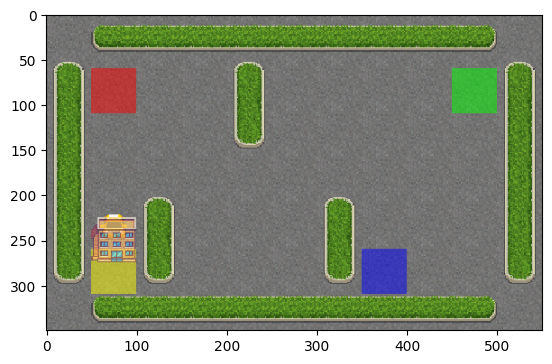

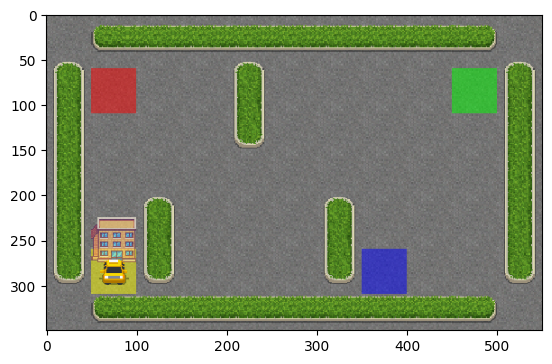

Value Iteration :: number of wins over 10000 episodes = 10000
Value Iteration :: average reward over 10000 episodes = 7.9458


In [17]:
n_episodes = 10_000
discount_factor = 0.6
theta = 1e-5
max_iterations = 1e5

vis_episode = random.randint(0, n_episodes)

# Apply best policy to the real environment
wins, total_reward, average_reward = play_episodes(environment,
                                                   n_episodes,
                                                   discount_factor,
                                                   theta,
                                                   max_iterations,
                                                   vis_episode)
print(f'Value Iteration :: number of wins over {n_episodes} episodes = {wins}')
print(f'Value Iteration :: average reward over {n_episodes} episodes = {average_reward}')

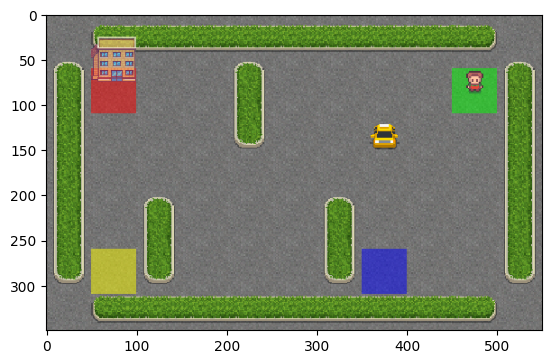

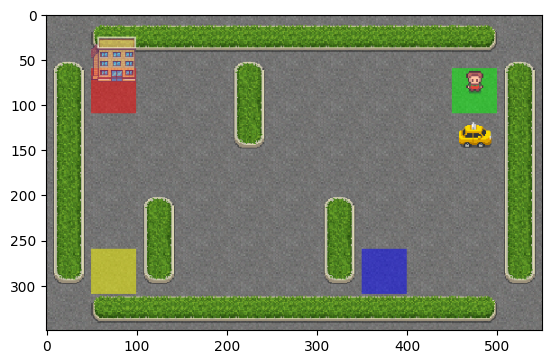

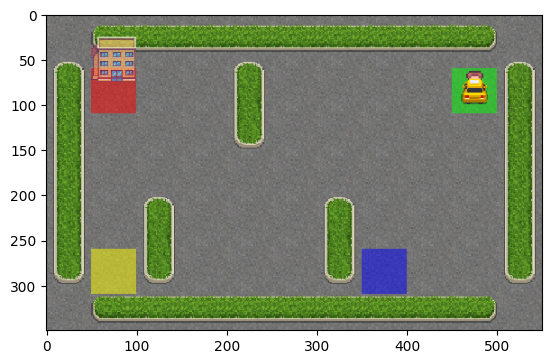

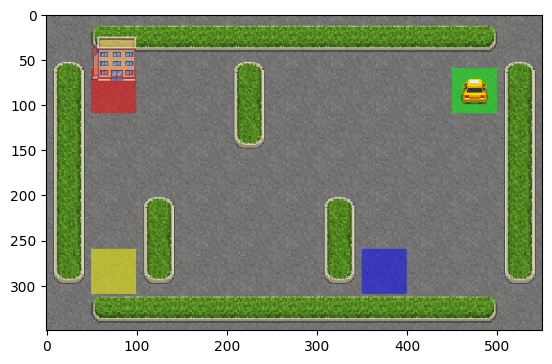

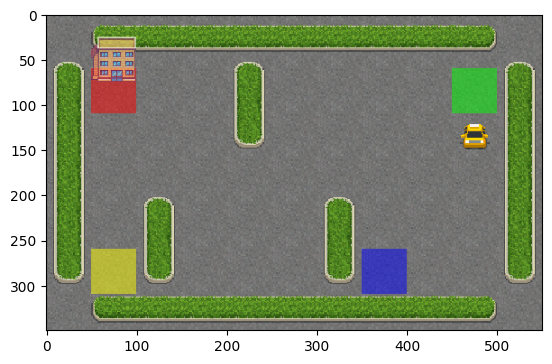

...

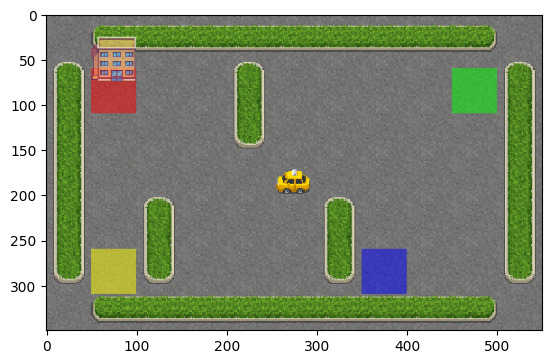

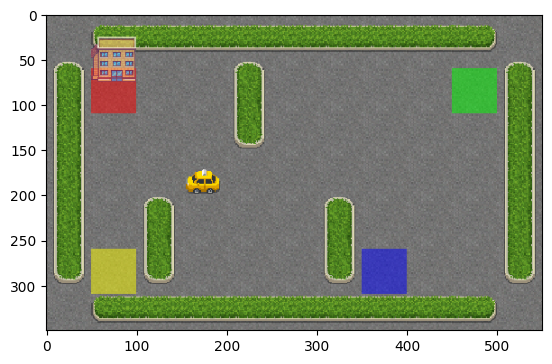

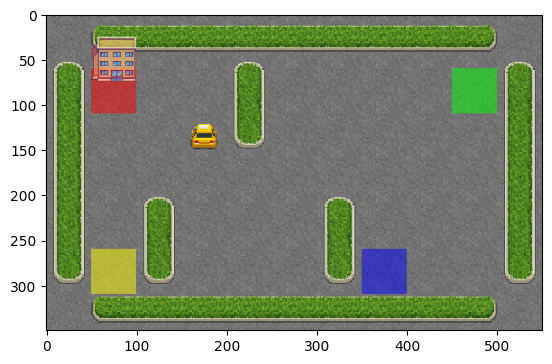

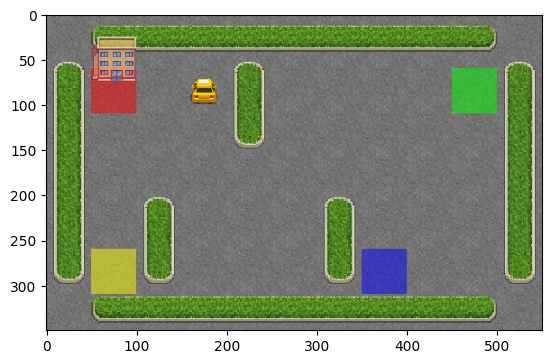

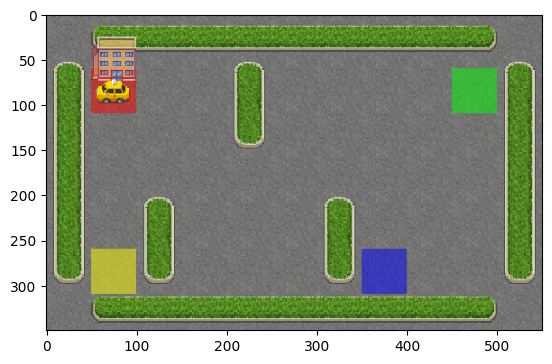

Value Iteration :: number of wins over 10000 episodes = 10000
Value Iteration :: average reward over 10000 episodes = 7.9326


In [18]:
n_episodes = 10_000
discount_factor = 0.6
theta = 1e-5
max_iterations = 1e5

vis_episode = random.randint(0, n_episodes)

environment.reset()
start = time.time()
policy, V = value_iteration(environment.env,
                            discount_factor=discount_factor,
                            theta=theta,
                            max_iterations=max_iterations)
done = time.time()
elapsed = done - start
# Apply best policy to the real environment
wins, total_reward, average_reward = play_episodes_by_policy(environment, n_episodes, policy, vis_episode)
print(f'Value Iteration :: number of wins over {n_episodes} episodes = {wins}')
print(f'Value Iteration :: average reward over {n_episodes} episodes = {average_reward}')